# SIBUR competition baseline

In [1]:
# Импорт нужных библиотек и настройка глобальных параметров ноутбука
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
import bokeh
import seaborn as sns

from sklearn.metrics import mean_squared_error as MSE
from sklearn.preprocessing import MinMaxScaler

%matplotlib inline
pd.set_option('display.max_columns', 500)
plt.rcParams['figure.figsize'] = (10,3)

targets = ['target', 'target2', 'target3', 'target4', 'target5']

In [2]:
# common functions
def print_learning_curve(history, skip_first=3):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(len(loss))

    plt.plot(epochs[skip_first:], loss[skip_first:], 'bo', label='Training loss')
    plt.plot(epochs[skip_first:], val_loss[skip_first:], 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()
    
def save_prediction(pred, index=None, filename='predict.csv'):
    # Save prediction to file, needed X_test for datetime index if index=None
    if index is None:
        df = pd.DataFrame(pred, index=X_test['2018':].index, columns=['target'])
    else:
        df = pd.DataFrame(pred, index=index, columns=['target'])
    df['target'].to_csv(filename, index=True, header=True)
    
def quality_metric(target, prediction, print_result=True):
    # Quality metric
    rmse_on_test = MSE(target, prediction)**0.5
    rmse_on_baseline = MSE([target.mean()] * len(target), prediction)**0.5
    
    if print_result:
        print('prediction rmse', rmse_on_test)
        print('simple mean() rmse', rmse_on_baseline)
    return rmse_on_test, rmse_on_baseline

def scale_dataframe(df, scaler):
    # scale df with scaler
    columns = df.columns
    index = df.index
    scaled_df = pd.DataFrame(scaler.transform(df), columns=columns, index=index)
    
    return scaled_df   

def restore_dataframe(scaled_df, scaler):
    columns = scaled_df.columns
    index = scaled_df.index
    df = pd.DataFrame(scaler.inverse_transform(scaled_df), columns=columns, index=index)
    return df


def train_test_split(df, train_len=None):
    if train_len is None:
        train_len = int(0.8*len(df))
    
    X_train = df.drop(targets[1:], axis=1).iloc[:train_len]
    y_train = df[targets].iloc[:train_len]
    X_test = df.drop(targets[1:], axis=1).iloc[train_len:]
    y_test = df[targets].iloc[train_len:]
    
    return X_train, y_train, X_test, y_test

In [3]:
def create_date_features(df, start_T=0):
    df['minute'] = df.index.minute
    df['hour'] = df.index.hour
    df['day'] = df.index.day
    df['weekday'] = df.index.weekday
    df['month'] = df.index.month
    df['is_weekend'] = df.index.weekday.isin([5, 6]) * 1
    
    K = 8
    period = 7*24
    
    T = len(df) + 1
    # добавляем sin и cos признаки
    for k in range(1, K+1):
        df['s' + str(k)] = [np.sin(i * 2 * np.pi * k / period) for i in range(start_T + 1, start_T + T)]
        df['c' + str(k)] = [np.cos(i * 2 * np.pi * k / period) for i in range(start_T + 1, start_T + T)]
        
    return df


def generate_features(data, n_fast=8, n_slow=7*24):
    df = data.copy()
    df['fast_mean'] = df.target.rolling(n_fast).mean()
    df['slow_mean'] = df.target.rolling(n_slow).mean()

    df.fillna(method='bfill', inplace=True)

    return df


def preprocessing(df, train_data=True, generate_tearget_features=True):
    
    if train_data:
        df = create_date_features(df)
    else:
        df = create_date_features(df, start_T=len(X_train-1))
    if generate_tearget_features:
        df = generate_features(df)
    return df


def calc_corr_features(stats, corr_threshold = 0.40):
    high_corr = stats[stats.Trend_correlation>corr_threshold][['Feature', 'Trend_correlation']]
    low_corr = stats[stats.Trend_correlation<-corr_threshold][['Feature', 'Trend_correlation']]
    corr_features = pd.concat([high_corr, low_corr]) # + ['target']
    corr_features.set_index('Feature', inplace=True)
    corr_features = corr_features.sort_values('Trend_correlation')
    print('Total number of features: ', len(X_train_fe.columns))
    print('Number of highly correlated features: ', len(corr_features))
    corr_features.hvplot.barh(width=400, height=len(corr_features)*15)
    
    return corr_features

In [7]:
# count if feature not in mean +/- 3*std_dev
def anomaly_detection_std(df, feature_names=None, outliers_threshold = 10):
    std_mean = df.mean()
    std_dev = df.std()
    if feature_names is None:
        feature_names = df.columns
    
    X_outlier = pd.DataFrame(index=df.index)
    for col in feature_names:
        X_outlier[col+'_outlier'] = np.where(((df[col] > std_mean[col] + 3*std_dev[col]) 
                                            | (df[col] < std_mean[col] - 3*std_dev[col])), 1, 0)
    X_outlier['outliers_sum'] = X_outlier.sum(axis=1).astype('int')    
    df['outlier'] = np.where(X_outlier['outliers_sum'] > outliers_threshold, 1, 0)
    return df

def anomaly_markdown_std(df, std_mean, std_dev, feature_names=None, outliers_threshold = 10):
    X_outlier = pd.DataFrame(index=df.index)
    if feature_names is None:
        feature_names = df.columns
        
    for col in feature_names:
        X_outlier[col+'_outlier'] = np.where(((df[col] > std_mean[col] + 3*std_dev[col]) 
                                            | (df[col] < std_mean[col] - 3*std_dev[col])), 1, 0)
    X_outlier['outliers_sum'] = X_outlier.sum(axis=1).astype('int')    
    df['outlier'] = np.where(X_outlier['outliers_sum'] > outliers_threshold, 1, 0)
    return df

In [8]:
# read raw data
sensors = pd.read_csv('data/sensors.csv', parse_dates=['timestamp'], index_col='timestamp')
coke = pd.read_csv('data/coke_target.csv', parse_dates=['timestamp'], index_col='timestamp')
reactor_pressure = pd.read_csv('data/reactor_pressure_target.csv', parse_dates=['timestamp'], index_col='timestamp')

temp_on_he = pd.read_csv('data/temp_on_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
pressure_he = pd.read_csv('data/pressure_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
activity = pd.read_csv('data/activity_target.csv', parse_dates=['timestamp'], index_col='timestamp')

reactor_pressure.columns = ['target2']
temp_on_he.columns = ['target3']
pressure_he.columns = ['target4']
activity.columns = ['target5']

# merge to one dataframe
merged_df = pd.merge(sensors, coke, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, reactor_pressure, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, temp_on_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, pressure_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, activity, on='timestamp', how='outer')
merged_df = merged_df.fillna(method='ffill').fillna(method='bfill')

lookback = 30*24
step = 6
delay = 10
batch_size = 64

scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

validation_start_index = len(merged_df[:'2017-11-01 00:00:00'])
test_start_index = len(merged_df[:'2017-11-15 00:00:00'])
prediction_start_index = len(merged_df[:'2017-12-31 23:00:00'])

In [9]:
X_train, y_train, X_test, y_test = train_test_split(merged_df[:'2017-12-01 23:00:00'], len(merged_df[:'2017-11-01 23:00:00']))
X_train = scale_dataframe(X_train, scaler.fit(X_train))
y_train = scale_dataframe(y_train[['target']], target_scaler.fit(y_train[['target']]))
X_train = preprocessing(X_train)

X_test = scale_dataframe(X_test, scaler)
X_test = preprocessing(X_test, train_data=False)
feature_names = X_train.columns[:48].tolist()

In [7]:
width = 490
height = 200

train = merged_df[:'2017-12-31 23:00:00']
graph1 = train.f_0.hvplot(width = width, height = height) + train.target3.hvplot(width = width, height = height) + \
        train.target.hvplot(width = width, height = height) + train.target4.hvplot(width = width, height = height) + \
        train.target2.hvplot(width = width, height = height) + train.target5.hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.F_0     :Curve   [timestamp]   (f_0)
   .Curve.Target3 :Curve   [timestamp]   (target3)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Target4 :Curve   [timestamp]   (target4)
   .Curve.Target2 :Curve   [timestamp]   (target2)
   .Curve.Target5 :Curve   [timestamp]   (target5)

### outliers detection on quantiles

In [6]:
# count if feature greater quantile99 or less than quant01
quantile01 = X_train.quantile(0.003)
quantile99 = X_train.quantile(0.997)
outliers_threshold = 3

X_outlier = pd.DataFrame(index=X_train.index)
for col in feature_names:
    X_outlier[col+'_outlier'] = np.where(((X_train[col] > quantile99[col]) | (X_train[col] < quantile01[col])), 1, 0)
X_outlier['outliers_sum'] = X_outlier.sum(axis=1).astype('int')  

X_train['outlier'] = np.where(X_outlier['outliers_sum'] > outliers_threshold, 1, 0)

In [7]:
feat = 'f_26'
print(quantile01[feat], quantile99[feat])
X_train[[feat, 'outlier']].hvplot()

0.004144131796755318 0.9949966254584068


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

### outliers detection on mean +/- 3*std_dev

In [10]:
feat = 'f_26'
X_train = anomaly_detection_std(X_train, feature_names=feature_names)
std_mean = X_train.mean()
std_dev = X_train.std()
print(std_mean[feat], std_dev[feat], '[', std_mean[feat] - 2*std_dev[feat], std_mean[feat] + 2*std_dev[feat], ']')
X_train[[feat, 'outlier']].hvplot()

0.9139219606478896 0.18292240781505398 [ 0.5480771450177816 1.2797667762779974 ]


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [138]:
# basic boosting decision.. poor results witout time-specific features
'''
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=10)
gbr = GradientBoostingRegressor()

scores=[]
full_prediction = []
for train_ind, test_ind in tscv.split(X_train):
    used_indexes = len(train_ind) + len(test_ind)
    gbr.fit(X_train.iloc[train_ind], y_train.iloc[train_ind])
    pred = gbr.predict(X_train.iloc[test_ind])
    
    # for drawing prediction
    full_prediction.append(np.concatenate([y_train[train_ind].values, pred, np.zeros(len(X_train) - used_indexes)]))
    
    score = MSE(y_train.iloc[test_ind], pred)**0.5
    scores.append(score)
    print('train len: ', len(train_ind), '\t till ', X_train.index[train_ind[-1]]  ,'\t score: ' , score)

print('average score: ', np.mean(scores))
'''

train len:  880 	 till  2016-11-30 07:00:00 	 score:  0.028957498620716986
train len:  1760 	 till  2017-01-05 23:00:00 	 score:  0.021360121313438448
train len:  2640 	 till  2017-02-11 15:00:00 	 score:  0.04706813769914177
train len:  3520 	 till  2017-03-20 07:00:00 	 score:  0.04360052296331629
train len:  4400 	 till  2017-04-25 23:00:00 	 score:  0.010560717297942007
train len:  5280 	 till  2017-06-01 15:00:00 	 score:  0.01208986803858466
train len:  6160 	 till  2017-07-08 07:00:00 	 score:  0.012577113424656066
train len:  7040 	 till  2017-08-13 23:00:00 	 score:  0.009329433611775222
train len:  7920 	 till  2017-09-19 15:00:00 	 score:  0.05452779289072231
train len:  8800 	 till  2017-10-26 07:00:00 	 score:  0.009481317140706245
average score:  0.024955252300099998


In [11]:
# basic boosting decision.. poor results witout time-specific features
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=10)
gbr = GradientBoostingRegressor()

y_train = X_train['target']
X_train = X_train.drop('target', axis=1)

scores=[]
full_prediction = []
for train_ind, test_ind in tscv.split(X_train):
    used_indexes = len(train_ind) + len(test_ind)
    gbr.fit(X_train.iloc[train_ind], y_train.iloc[train_ind])
    pred = gbr.predict(X_train.iloc[test_ind])
    
    # for drawing prediction
    full_prediction.append(np.concatenate([y_train[train_ind].values, pred, np.zeros(len(X_train) - used_indexes)]))
    
    score = MSE(y_train.iloc[test_ind], pred)**0.5
    scores.append(score)
    print('train len: ', len(train_ind), '\t till ', X_train.index[train_ind[-1]]  ,'\t score: ' , score)

print('average score: ', np.mean(scores))

C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


train len:  820 	 till  2016-11-27 19:00:00 	 score:  0.030490946344793865
train len:  1634 	 till  2016-12-31 17:00:00 	 score:  0.017353595594242873
train len:  2448 	 till  2017-02-03 15:00:00 	 score:  0.05205894642968941
train len:  3262 	 till  2017-03-09 13:00:00 	 score:  0.02184883997694633
train len:  4076 	 till  2017-04-12 11:00:00 	 score:  0.04395124323729179
train len:  4890 	 till  2017-05-16 09:00:00 	 score:  0.012760037610207536
train len:  5704 	 till  2017-06-19 07:00:00 	 score:  0.013141439853243888
train len:  6518 	 till  2017-07-23 05:00:00 	 score:  0.010693852875548528
train len:  7332 	 till  2017-08-26 03:00:00 	 score:  0.05780141987149084
train len:  8146 	 till  2017-09-29 01:00:00 	 score:  0.01007947768140161
average score:  0.027017979947485664


In [13]:
indices = np.argsort(gbr.feature_importances_)[::-1]
#X_train.columns.values[indices[:20]]
importance_df = pd.DataFrame({'importance': gbr.feature_importances_[indices[:20]]}, 
                             index=X_train.columns.values[indices[:20]])
importance_df.hvplot.barh()

:Bars   [index]   (importance)

In [14]:
# validation step!
X_val_raw = merged_df['2017-12-01 23:00:00':'2018-01-01 00:00:00'].drop(targets[1:], axis=1)
y_val = merged_df['2017-12-01 23:00:00':'2018-01-01 00:00:00'][['target']]

X_val = scale_dataframe(X_val_raw, scaler)
X_val = preprocessing(X_val, train_data=False)
X_val = anomaly_markdown_std(X_val, X_train.mean(), X_train.std(), feature_names=feature_names, outliers_threshold=10)

val_pred = gbr.predict(X_val.drop('target', axis=1))

pred_df = pd.DataFrame(val_pred, index=X_val_raw.index, columns=['prediction'])
pred_df = restore_dataframe(pred_df, target_scaler)
quality_metric(y_val, pred_df.prediction)

prediction rmse 0.07189278182475312
simple mean() rmse 0.23403661082812385


(0.07189278182475312, 0.23403661082812385)

In [15]:
pred_df.prediction.hvplot() * y_val.target.hvplot()

:Overlay
   .Curve.Prediction :Curve   [timestamp]   (prediction)
   .Curve.Target     :Curve   [timestamp]   (target)

In [16]:
# draw prediction - score is 0.07381683384538541
# best is scale all features and boosting

pred_df = pd.DataFrame(full_prediction[9], index=X_train.index)
pred_df = restore_dataframe(pred_df, target_scaler)
print(pred_df.mean())

quality_metric(pred_df, merged_df.loc[pred_df.index].target)
pred_df.hvplot() * merged_df.target.hvplot()

0    3.140359
dtype: float64
prediction rmse 0.02000395865115537
simple mean() rmse 0.5346552116093015


:Overlay
   .Curve.I      :Curve   [timestamp]   (0)
   .Curve.Target :Curve   [timestamp]   (target)

In [17]:
# prediction
X_pred = merged_df['2018-01-01 00:00:00':].drop(targets[1:], axis=1)
X_pred = scale_dataframe(X_pred, scaler)
X_pred = preprocessing(X_pred, train_data=False)
X_pred = anomaly_markdown_std(X_pred, X_train.mean(), X_train.std(), feature_names=feature_names, outliers_threshold=10)

pred = gbr.predict(X_pred.drop('target', axis=1))

pred_df = pd.DataFrame(pred, index=X_pred.index, columns=['prediction'])
pred_df = restore_dataframe(pred_df, target_scaler)

#save_prediction(pred_df.values, index=pred_df.index, filename='grad_boost_anomaly.csv')

pred_df.prediction.hvplot() * merged_df.target.hvplot()*X_pred.outlier.hvplot()

# scaled sklearn boosting
# 0.4770 оценка  RMSE
#  my score: 0.026882 -> 0.07301195

:Overlay
   .Curve.Prediction :Curve   [timestamp]   (prediction)
   .Curve.Target     :Curve   [timestamp]   (target)
   .Curve.Outlier    :Curve   [timestamp]   (outlier)

# feature importance!

In [18]:
from featexp import get_univariate_plots
from featexp import get_trend_stats

X_train_fe, y_train_fe, X_test_fe, y_test_fe = train_test_split(merged_df[:'2017-12-01 23:00:00'], 
                                                                len(merged_df[:'2017-11-01 23:00:00']))
X_train_fe = scale_dataframe(X_train_fe, scaler.fit(X_train_fe))
y_train_fe = scale_dataframe(y_train_fe[['target']], target_scaler.fit(y_train_fe[['target']]))
X_train_fe = preprocessing(X_train_fe)
X_train_fe = anomaly_detection_std(X_train_fe, feature_names=feature_names)

X_test_fe = scale_dataframe(X_test_fe, scaler)
X_test_fe = preprocessing(X_test_fe, train_data=False)

                                            Plots for f_0                                             
                                           Train data plots                                           


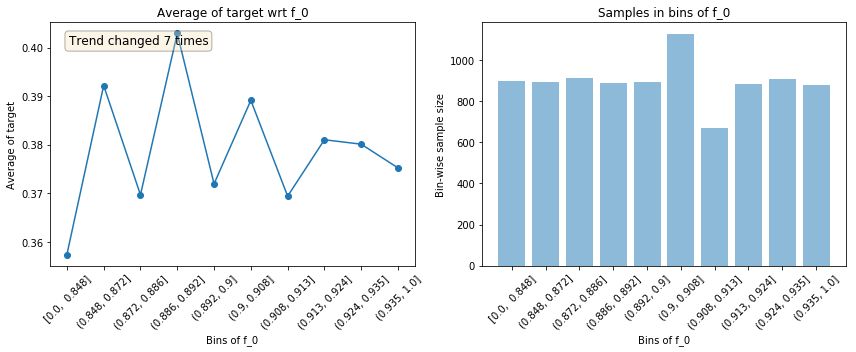

                                           Test data plots                                            


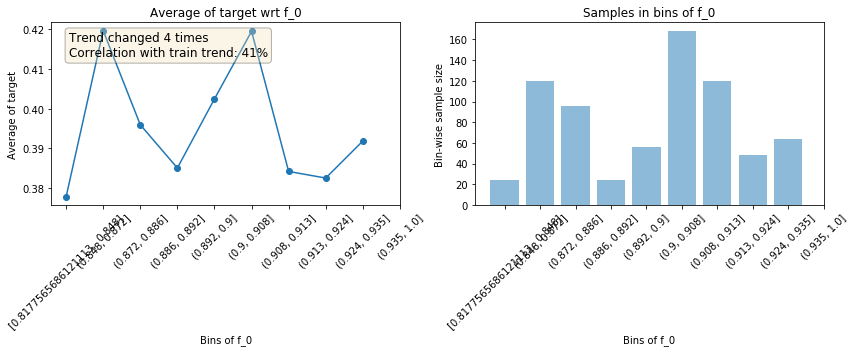

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_1                                             
                                           Train data plots                                           


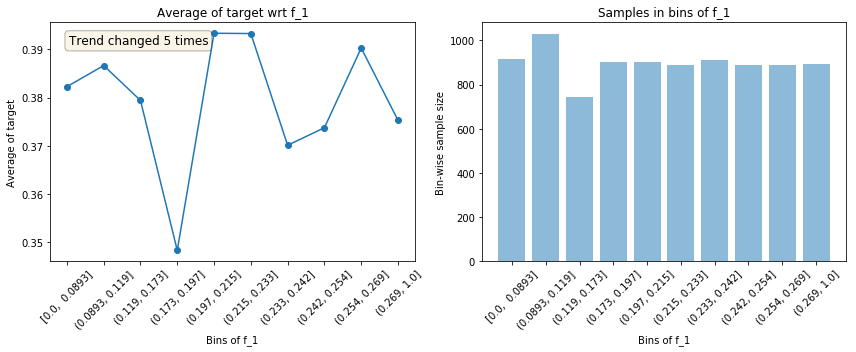

                                           Test data plots                                            


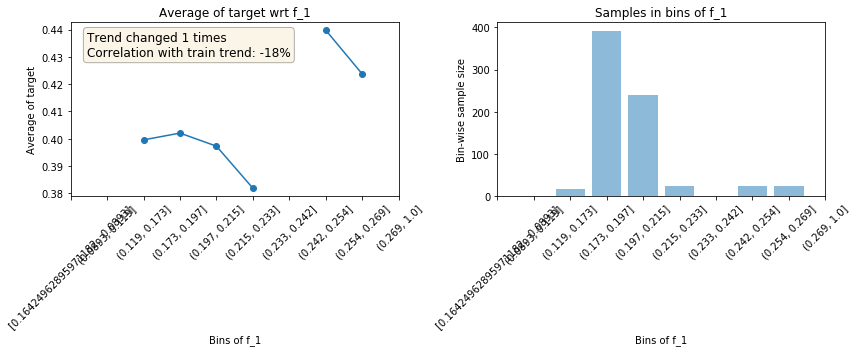

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_2                                             
                                           Train data plots                                           


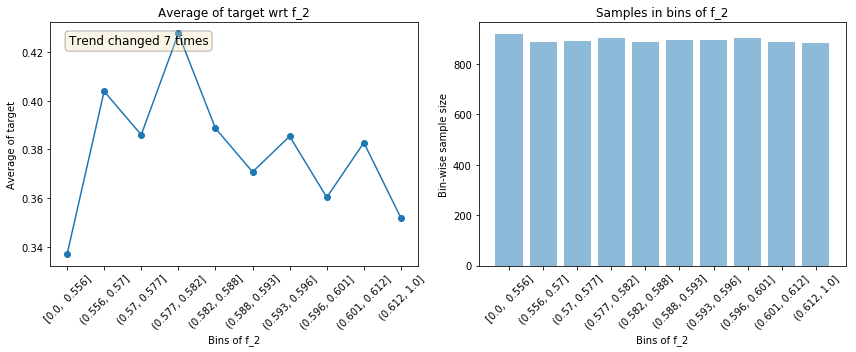

                                           Test data plots                                            


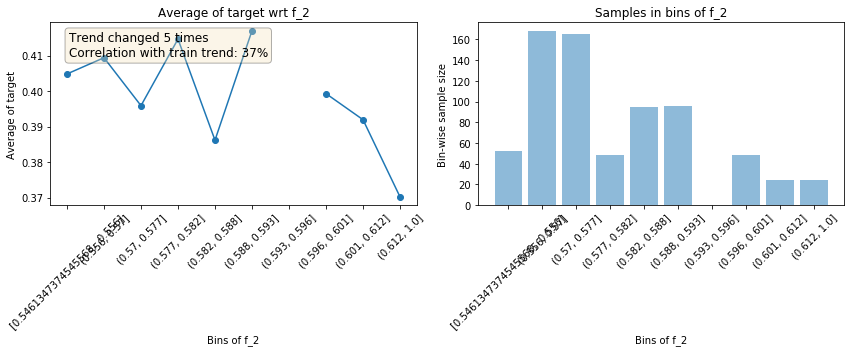

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_3                                             
                                           Train data plots                                           


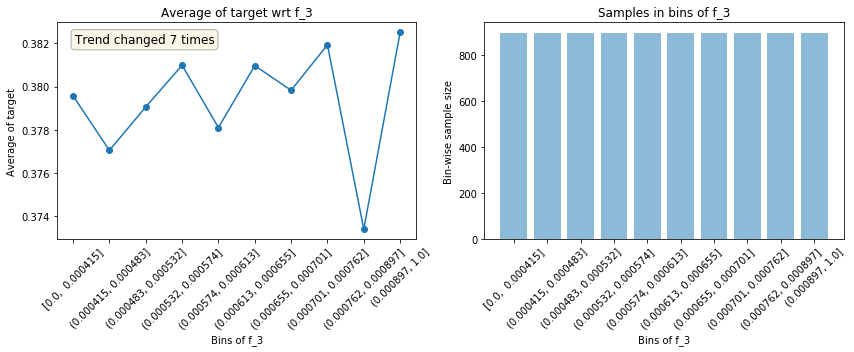

                                           Test data plots                                            


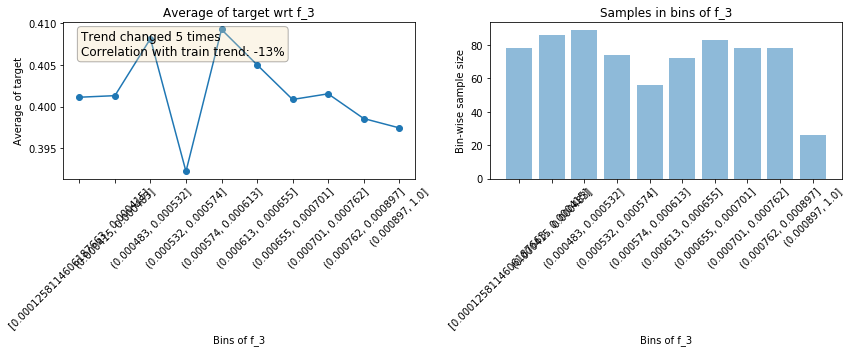

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_4                                             
                                           Train data plots                                           


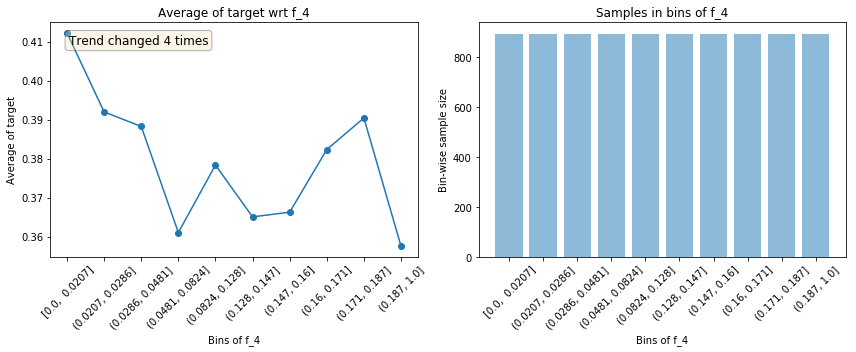

                                           Test data plots                                            


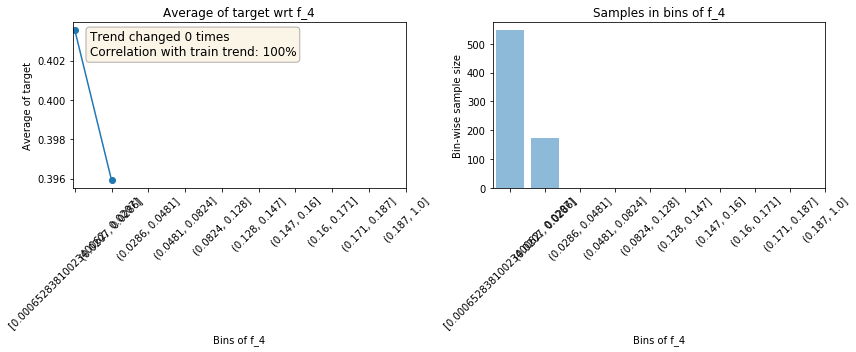

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_5                                             
                                           Train data plots                                           


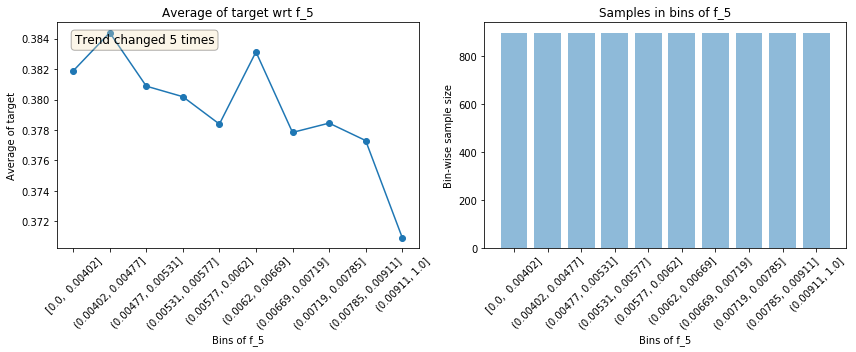

                                           Test data plots                                            


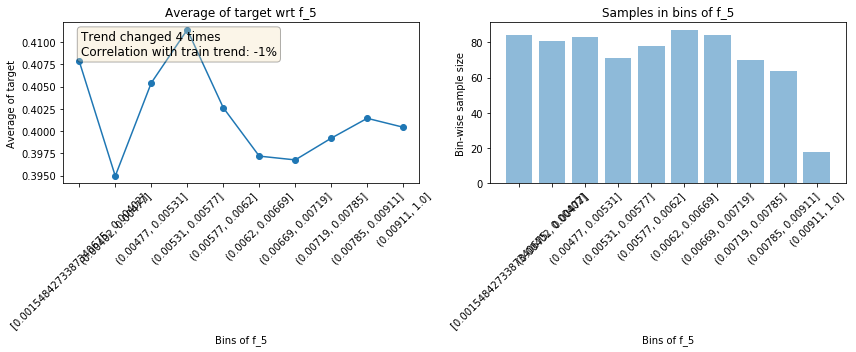

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_6                                             
                                           Train data plots                                           


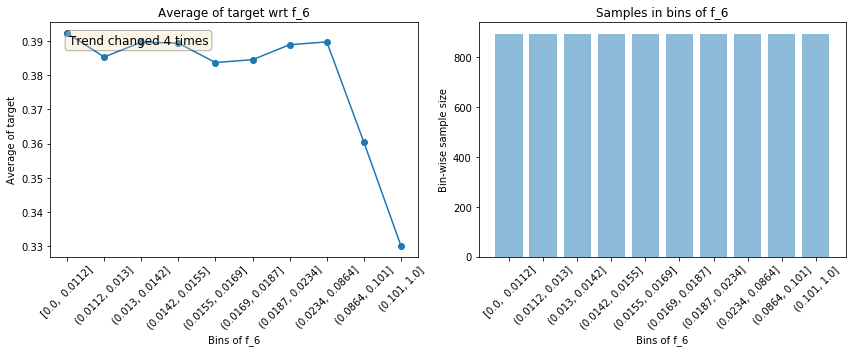

                                           Test data plots                                            


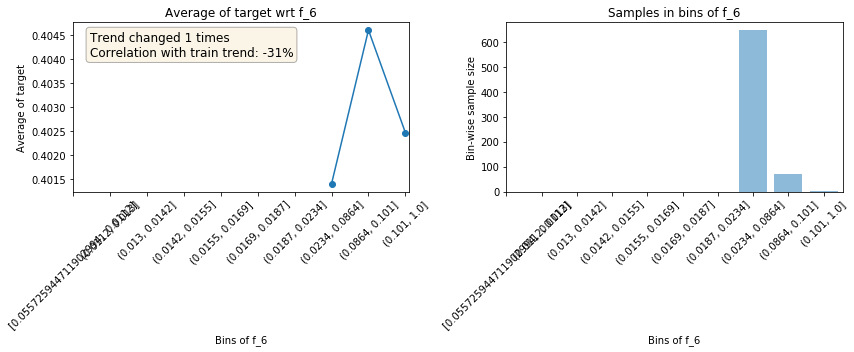

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_7                                             
                                           Train data plots                                           


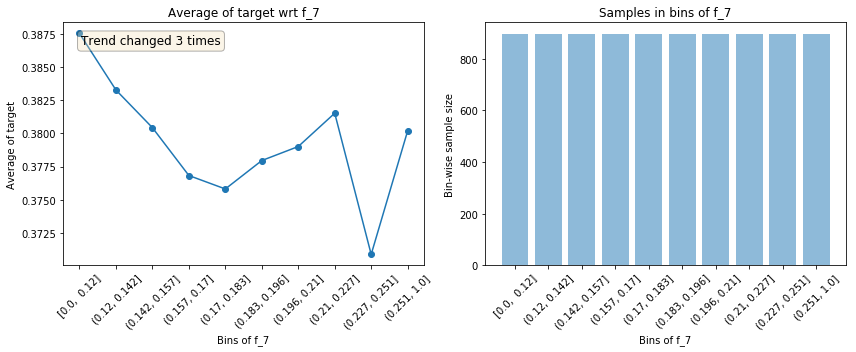

                                           Test data plots                                            


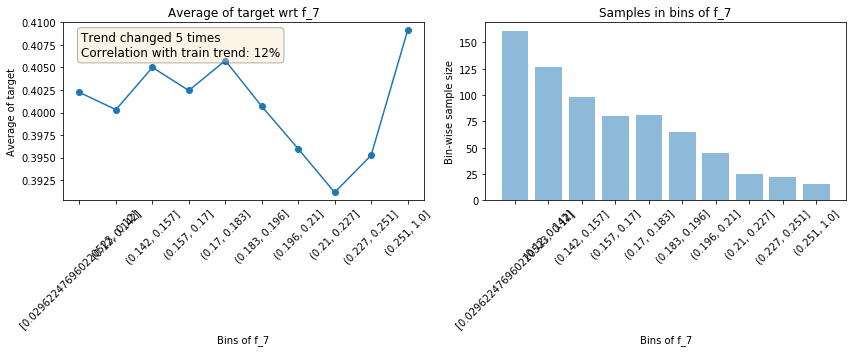

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_8                                             
                                           Train data plots                                           


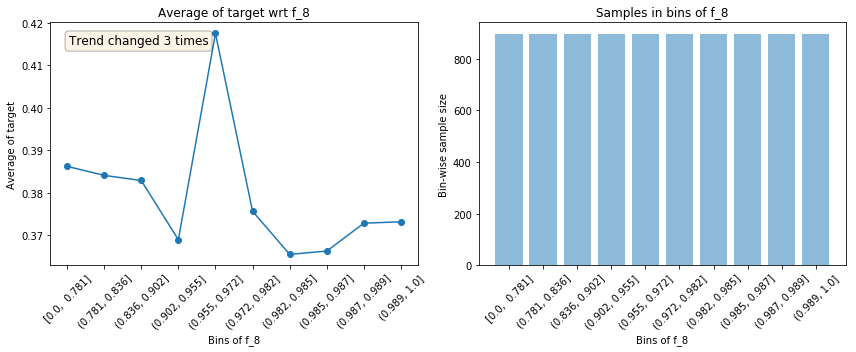

                                           Test data plots                                            


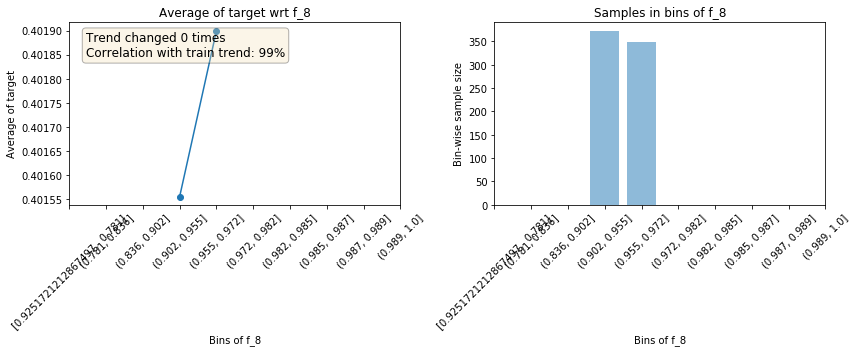

--------------------------------------------------------------------------------------------------------------


                                            Plots for f_9                                             
                                           Train data plots                                           


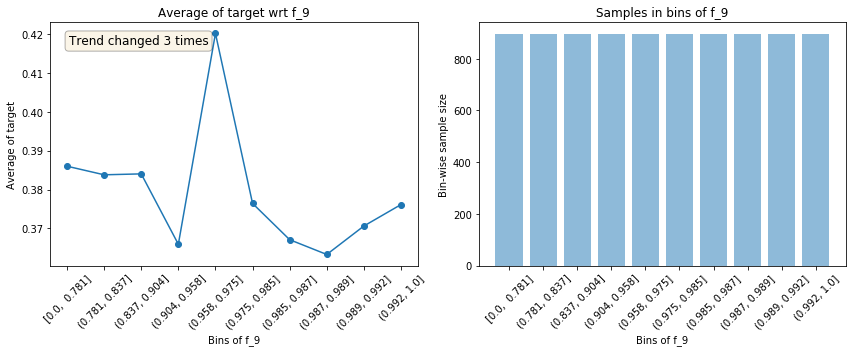

                                           Test data plots                                            


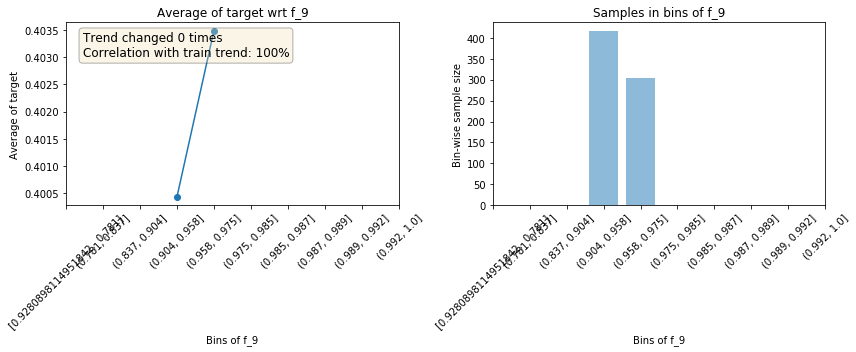

--------------------------------------------------------------------------------------------------------------




In [19]:
# Plots drawn for all features if nothing is passed in feature_list parameter.

get_univariate_plots(data=X_train_fe, target_col='target', data_test=X_test_fe,
                     features_list=X_train_fe.columns[:10].tolist(), bins=10)

## removing f_37 as noisy features

In [20]:
if 'f_37' in X_train_fe.columns:
    X_train_fe.drop('f_37', axis=1, inplace=True)
stats = get_trend_stats(data=X_train_fe, target_col='target', data_test=X_test_fe, #.drop('f_38', axis=1),
                     features_list=X_train_fe.columns[:-1].tolist(), bins=10)
#stats

Only one bin created for minute. Correlation can't be calculated
Categorical features ['target'] ignored. Categorical features not supported yet.
Returning stats for all numeric features


In [21]:
import warnings
#warnings.filterwarnings('ignore')

corr_features = calc_corr_features(stats, corr_threshold = 0.45)
features = corr_features.index.tolist() + ['outlier']

X_train_fe = X_train_fe[features].copy()
y_train_fe = y_train_fe.values

scores=[]
full_prediction = []
for train_ind, test_ind in tscv.split(X_train_fe):
    used_indexes = len(train_ind) + len(test_ind)
    gbr.fit(X_train_fe.iloc[train_ind], y_train_fe[train_ind])
    pred = gbr.predict(X_train_fe.iloc[test_ind])
    
    # for drawing prediction
    #full_prediction.append(np.concatenate([y_train.iloc[train_ind].values, pred, np.zeros(len(X_train_fe) - used_indexes)]))
    
    score = MSE(y_train_fe[test_ind], pred)**0.5
    scores.append(score)
    print('train len: ', len(train_ind), '\t till ', X_train_fe.index[train_ind[-1]]  ,'\t score: ' , score)

print('average score: ', np.mean(scores))

Total number of features:  73
Number of highly correlated features:  31


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  820 	 till  2016-11-27 19:00:00 	 score:  0.027221144220748027


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  1634 	 till  2016-12-31 17:00:00 	 score:  0.015771172312777512


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  2448 	 till  2017-02-03 15:00:00 	 score:  0.048504613376246876


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  3262 	 till  2017-03-09 13:00:00 	 score:  0.012747338519711755


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  4076 	 till  2017-04-12 11:00:00 	 score:  0.031260672334865985


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  4890 	 till  2017-05-16 09:00:00 	 score:  0.010661739708404686


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  5704 	 till  2017-06-19 07:00:00 	 score:  0.010703524980528942


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  6518 	 till  2017-07-23 05:00:00 	 score:  0.010310049448608704


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  7332 	 till  2017-08-26 03:00:00 	 score:  0.05704198358092713


C:\Progs\Anaconda3\envs\Keras\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train len:  8146 	 till  2017-09-29 01:00:00 	 score:  0.015703424321434217
average score:  0.02399256628042538


In [23]:
# validation step!
X_val_raw = merged_df['2017-12-01 23:00:00':'2018-01-01 00:00:00'].drop(targets[1:], axis=1)
y_val = merged_df['2017-12-01 23:00:00':'2018-01-01 00:00:00'][['target']]

X_val = scale_dataframe(X_val_raw, scaler)
X_val = preprocessing(X_val, train_data=False)
X_val = anomaly_markdown_std(X_val, X_train.mean(), X_train.std(), 
                             feature_names=corr_features.index, outliers_threshold=10)
X_val = X_val[features]

val_pred = gbr.predict(X_val)

pred_df = pd.DataFrame(val_pred, index=X_val_raw.index, columns=['prediction'])
pred_df = restore_dataframe(pred_df, target_scaler)
quality_metric(merged_df.loc[pred_df.index].target, pred_df.prediction)

pred_df.hvplot() * merged_df.target.hvplot() * X_pred.outlier.hvplot()

prediction rmse 0.10733740264232645
simple mean() rmse 0.24875406016890966


:Overlay
   .Curve.I       :Curve   [timestamp]   (prediction)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Outlier :Curve   [timestamp]   (outlier)

In [24]:
# prediction
X_pred_raw = merged_df['2018-01-01 00:00:00':].drop(targets[1:], axis=1)

X_pred = scale_dataframe(X_pred_raw, scaler)
X_pred = preprocessing(X_pred, train_data=False)
X_pred = anomaly_markdown_std(X_pred, X_train.mean(), X_train.std(), 
                             feature_names=corr_features.index, outliers_threshold=10)
X_pred = X_pred[features]

pred = gbr.predict(X_pred)

pred_df = pd.DataFrame(pred, index=X_pred_raw.index, columns=['prediction'])
pred_df = restore_dataframe(pred_df, target_scaler)

#save_prediction(pred_df.values, index=pred_df.index, filename='grad_boost_fe.csv')

# 0.4701 - 13 place
# my score is:  0.02370241580489297  ->  0.09581709090748912

In [25]:
pred_df.hvplot() * merged_df.target.hvplot() * X_pred.outlier.hvplot()

:Overlay
   .Curve.I       :Curve   [timestamp]   (prediction)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Outlier :Curve   [timestamp]   (outlier)

In [26]:
X_pred

,f_10,f_38,f_44,f_34,f_15,f_47,f_21,f_25,f_29,f_14,f_11,f_33,s6,c2,f_12,s3,weekday,f_36,c1,fast_mean,f_40,is_weekend,f_39,f_32,f_8,f_4,f_22,f_17,f_9,f_26,month,outlier
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,0.952732,0.977699,0.952675,0.529192,0.852893,0.923272,0.990834,0.995721,0.993087,0.637243,0.771750,0.673115,2.225209e-01,-4.338837e-01,0.776627,1.119645e-01,0,1.077502,-0.532032,0.406635,0.855221,0,0.973661,0.530051,0.957390,0.020250,0.946270,0.885127,0.960500,0.916626,1,0
2018-01-01 01:00:00,0.953937,0.977545,0.952732,0.532160,0.864295,0.926780,0.986226,0.995014,0.991653,0.607031,0.769282,0.672225,4.338837e-01,-3.653410e-01,0.774211,2.225209e-01,0,1.076744,-0.563320,0.406635,0.852991,0,0.971924,0.522131,0.952694,0.020738,0.971417,0.935743,0.953163,0.959487,1,0
2018-01-01 02:00:00,0.950015,0.977826,0.955247,0.527832,0.882955,0.923632,0.987267,0.990695,0.992977,0.775500,0.766363,0.675162,6.234898e-01,-2.947552e-01,0.775437,3.302791e-01,0,1.081518,-0.593820,0.406635,0.852255,0,0.976433,0.528389,0.952562,0.016393,0.988755,0.963886,0.951575,0.995404,1,0
2018-01-01 03:00:00,0.952574,0.979725,0.953632,0.526736,0.879820,0.916894,0.994303,0.994988,0.993744,0.684656,0.771835,0.678961,7.818315e-01,-2.225209e-01,0.777399,4.338837e-01,0,1.076742,-0.623490,0.406635,0.856667,0,0.971648,0.529042,0.955882,0.015866,0.989650,0.964293,0.957158,0.988680,1,0
2018-01-01 04:00:00,0.950158,0.974433,0.953540,0.524447,0.893653,0.903845,0.990730,0.993632,0.995750,0.696115,0.768229,0.677814,9.009689e-01,-1.490423e-01,0.773329,5.320321e-01,0,1.079457,-0.652287,0.406635,0.851432,0,0.971314,0.527829,0.959210,0.012210,0.993422,0.963126,0.954346,0.982995,1,0
2018-01-01 05:00:00,0.951974,0.975482,0.951490,0.525164,0.898327,0.902627,0.985895,0.994285,0.992824,0.699593,0.770334,0.676794,9.749279e-01,-7.473009e-02,0.773712,6.234898e-01,0,1.080365,-0.680173,0.406635,0.855229,0,0.976293,0.529718,0.955763,0.017295,0.989938,0.965072,0.959637,0.994737,1,0
2018-01-01 06:00:00,0.954551,0.976818,0.955962,0.521284,0.901084,0.917457,0.991925,0.995869,0.994110,0.675152,0.768256,0.675522,1.000000e+00,-8.476598e-14,0.775053,7.071068e-01,0,1.077249,-0.707107,0.406635,0.858794,0,0.973325,0.524650,0.952969,0.020613,0.988665,0.972894,0.956812,0.990375,1,0
2018-01-01 07:00:00,0.952717,0.977220,0.956234,0.519932,0.900718,0.899669,0.992569,0.995888,0.996856,0.613874,0.774470,0.677989,9.749279e-01,7.473009e-02,0.775577,7.818315e-01,0,1.076503,-0.733052,0.406635,0.861381,0,0.975312,0.525317,0.957515,0.020771,0.988968,0.963904,0.954330,0.996524,1,0
2018-01-01 08:00:00,0.953965,0.979139,0.955869,0.518695,0.896086,0.926474,0.990809,0.994872,0.993244,0.660929,0.768888,0.672418,9.009689e-01,1.490423e-01,0.775714,8.467242e-01,0,1.074924,-0.757972,0.406635,0.858709,0,0.972825,0.528105,0.953592,0.011221,0.991572,0.964996,0.958818,0.990325,1,0


## Without fast and slow mean features

In [78]:
X_train_fe, y_train_fe, X_test_fe, y_test_fe = train_test_split(merged_df[:'2017-12-01 23:00:00'], len(merged_df[:'2017-11-01 23:00:00']))
X_train_fe = scale_dataframe(X_train_fe, scaler.fit(X_train_fe))
y_train_fe = scale_dataframe(y_train_fe[['target']], target_scaler.fit(y_train_fe[['target']]))
X_train_fe = preprocessing(X_train_fe, generate_tearget_features=False)
X_train_fe = anomaly_detection_std(X_train_fe)

X_test_fe = scale_dataframe(X_test_fe, scaler)
X_test_fe = preprocessing(X_test_fe, train_data=False, generate_tearget_features=False)

# finding correlated with target features
if 'f_37' in X_train_fe.columns:
    X_train_fe.drop('f_37', axis=1, inplace=True)
stats = get_trend_stats(data=X_train_fe, target_col='target', data_test=X_test_fe,
                     features_list=X_train_fe.columns[:-1].tolist(), bins=10)

corr_features = calc_corr_features(stats)
features = corr_features.index.tolist() + ['outlier']

X_train_fe = X_train_fe[features].copy()
y_train_fe = y_train_fe.values

scores=[]
full_prediction = []
for train_ind, test_ind in tscv.split(X_train_fe):
    used_indexes = len(train_ind) + len(test_ind)
    gbr.fit(X_train_fe.iloc[train_ind], y_train_fe[train_ind])
    pred = gbr.predict(X_train_fe.iloc[test_ind])
    
    # for drawing prediction
    full_prediction.append(np.concatenate([y_train[train_ind].values, pred, np.zeros(len(X_train_fe) - used_indexes)]))
    
    score = MSE(y_train_fe[test_ind], pred)**0.5
    scores.append(score)
    print('train len: ', len(train_ind), '\t till ', X_train_fe.index[train_ind[-1]]  ,'\t score: ' , score)

print('average score: ', np.mean(scores))

Only one bin created for minute. Correlation can't be calculated
Categorical features ['target'] ignored. Categorical features not supported yet.
Returning stats for all numeric features
Total number of features:  71
Number of highly correlated features:  33
train len:  820 	 till  2016-11-27 19:00:00 	 score:  0.08728361558664956
train len:  1634 	 till  2016-12-31 17:00:00 	 score:  0.10879317631785644
train len:  2448 	 till  2017-02-03 15:00:00 	 score:  0.09382861150795274
train len:  3262 	 till  2017-03-09 13:00:00 	 score:  0.05287929533247037
train len:  4076 	 till  2017-04-12 11:00:00 	 score:  0.11666439059622111
train len:  4890 	 till  2017-05-16 09:00:00 	 score:  0.035766462022432575
train len:  5704 	 till  2017-06-19 07:00:00 	 score:  0.037976789627799774
train len:  6518 	 till  2017-07-23 05:00:00 	 score:  0.05156839622268819
train len:  7332 	 till  2017-08-26 03:00:00 	 score:  0.1549627967644507
train len:  8146 	 till  2017-09-29 01:00:00 	 score:  0.105759946

In [79]:
pred_df = pd.DataFrame(full_prediction[9], index=X_train_fe.index)
print(pred_df.mean())
pred_df = restore_dataframe(pred_df, target_scaler)

quality_metric(merged_df.loc[pred_df.index].target, pred_df)
pred_df.hvplot() * merged_df.target.hvplot() * X_train_fe.outlier.hvplot()

0    0.385723
dtype: float64
prediction rmse 0.20989357326743668
simple mean() rmse 0.5548401136820584


:Overlay
   .Curve.I       :Curve   [timestamp]   (0)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Outlier :Curve   [timestamp]   (outlier)

In [63]:
# validation step!
X_val_raw = merged_df['2017-12-01 23:00:00':'2018-01-01 00:00:00'].drop(targets[1:], axis=1)
y_val = merged_df['2017-12-01 23:00:00':'2018-01-01 00:00:00'][['target']]

X_val = scale_dataframe(X_val_raw, scaler)
X_val = preprocessing(X_val, train_data=False, generate_tearget_features=False)
X_val = anomaly_markdown_std(X_val, X_train.mean(), X_train.std(), 
                             feature_names=corr_features.index, outliers_threshold=10)
X_val = X_val[features]

val_pred = gbr.predict(X_val)

pred_df = pd.DataFrame(val_pred, index=X_val_raw.index, columns=['prediction'])
pred_df = restore_dataframe(pred_df, target_scaler)
quality_metric(y_val, pred_df.prediction)

pred_df.hvplot() * merged_df.target.hvplot() * X_val.outlier.hvplot()

prediction rmse 0.5924624625826186
simple mean() rmse 0.5572918150800413


:Overlay
   .Curve.I       :Curve   [timestamp]   (prediction)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Outlier :Curve   [timestamp]   (outlier)

Удаление средних за 8 часов и 7 дней значительно ухудшило результат. 